# Cascade Classifier for good/bad quality picture

## Abstract

It is very often that a dog / cat gets an eye related illness. The pet, as well as its owners must be very nervous.
Furtheremore, the vet service tends to get very expensive. In order to make the lives for all parties more convinient, it's suggested to come up with an algorithm (Λ) that while taking pet's photo from a non-stressful distance - can run the neccessary analysis and report to the owners, as well as a dedicated vet - the severaty of the problem, and sugggest a course of action.

### Related Works

These articles have been published on related topics:
- [Real Time Eye Detector with Cascaded Convolutional Neural Network](https://www.hindawi.com/journals/acisc/2018/1439312/)
- [Developing a diagnosis model for dry eye disease in dogs using object detection](https://www.nature.com/articles/s41598-022-25867-y)
- [CNN-based diagnosis models for canine ulcerative keratitis](https://www.nature.com/articles/s41598-019-50437-0)
- [Deep learning for identifying corneal diseases from ocular surface slit-lamp photographs](https://www.nature.com/articles/s41598-020-75027-3)

This notebook is dedicated for developing such (Λ) algorithm

### The Main Idea

We can divide the (Λ) algorithm into 2 big parts:
1. the camera detection of the eyes and its components classifier (live)
2. the illness detection classifer (server-side)

## Code Section

### Imports, Utility Functions

Load dependancy modules

In [1]:
from pandas import DataFrame, read_csv as pandas_read_csv
from polars import from_pandas as to_polars, read_csv as polars_read_csv
 
from cv2 import imread, imshow, waitKey, destroyAllWindows
from cv2 import cvtColor, COLOR_BGR2RGB

from glob import glob
from os import walk
from pathlib import Path
from natsort import natsort_keygen

from re import match

from time import perf_counter

import matplotlib.pyplot as plt

from tqdm.auto import tqdm, trange
from ipywidgets import IntSlider, FloatSlider, interact, fixed
from PIL import Image
from math import ceil, sqrt
tqdm.pandas()

<!-- def transliterate(dir_path):
    i = 0
    for root,dirs,files in walk(dir_path):
        print(root)
        for file in files:
            path = Path(f'{root}/{file}')
            if (not match(r'[a-zA-Z0-9_\. -]+', file)) & (match(r'.+\.(jpg|JPG|jpeg)', file) is not None):
                i+=1
                path.rename(f"{root}/IMG_{round(perf_counter())}_{i}.jpg") # arbitrary name: the key is guarnteed to be unique
transliterate("cats+dogs") -->

#### Load images from a directory utility function

In [2]:
def fetch_images(dir_path, ext='jpg'):
    images = []
    for root, dirs, files in walk(dir_path):
        for dir in dirs:
            images += glob(f'{dir_path}/{dir}/*.{ext}')
        images += glob(f'{dir_path}/*.{ext}')
        images = list(set(images))
    return images

#### Loading the Data

In [3]:
filenames = fetch_images("../resources/cats_and_dogs")
len(filenames)

166

In [4]:
df = DataFrame({"img": filenames}).astype({'img': 'string'})
df['width'] = df.img.progress_apply(lambda x: Image.open(x).width).astype('int32')
df['height'] = df.img.progress_apply(lambda x: Image.open(x).height).astype('int32')

  0%|          | 0/166 [00:00<?, ?it/s]

  0%|          | 0/166 [00:00<?, ?it/s]

In [5]:
# pl_df = to_polars(df)

### Eye Detection

We will split the live algorithm into (2-3) different stages:
1. detect + crop the eye(s) in the picture - and save as (a) different picture(s)
2. detect sclera, iris and pupil in the frame
3. (additional landmarks) if necessary

In [6]:
def show_pictures_in_grid(df, start, end, grid_size: tuple[int, int] = (3, 4), fig_size:tuple[int,int] = (10, 10)):
    fig = plt.figure(figsize=fig_size)

    # setting values to rows and column variables
    rows, columns = grid_size
    size = rows * columns if end - start == rows * columns else end - start
    # reading images
    images = df.iloc[start:end, df.columns == 'img']
    slice = list(range(start, end))
    # Adds a subplot at the 1st position
    
    for i in trange(size):
        fig.add_subplot(rows, columns, i+1)

        # showing image
        plt.imshow(Image.open(images.iloc[i,0]))
        plt.axis('off')
        plt.title(f"image {slice[i]+1}")

The pictures can be divided into 3 groups. each of them will disscuss below
<!-- def statistics_benchmark_images(df, statistics):
    for _, (w,h) in enumerate(zip(statistics.width, statistics.height)):
        i = df[(df.width==w) | (df.height==h)].index
        plt.close()
        if len(i) >= 1:
            for j in range(len(i)):
                plt.figure(_+j)
                plt.imshow(cvtColor(imread(df.img[i[j]]), COLOR_BGR2RGB))
        plt.show() -->

1st group (Eyes): The dog eye is the only object visible in the frame. This makes the pictures best candidates, because one of the steps in the live algorithm can be skipped completely

  0%|          | 0/105 [00:00<?, ?it/s]

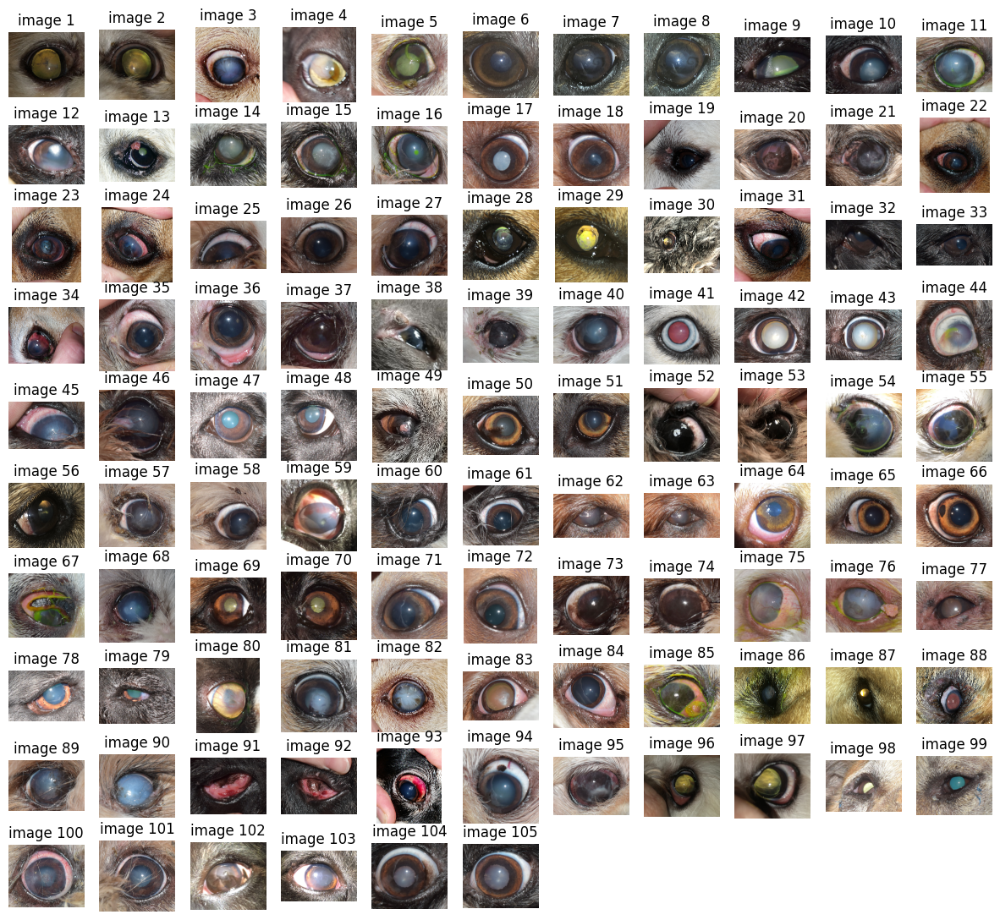

In [7]:
eyes = df[df.img.str.contains('eye_')].sort_values(by='img', key=natsort_keygen()).reset_index(drop=True)
gridsize = ceil(sqrt(len(eyes)))
show_pictures_in_grid(eyes, 0, len(eyes), grid_size=(gridsize, gridsize), fig_size=(15, 15))

Group 2 (Dogs): The frame includes the dog, the eyes are visible and open. These pictures are the next best candidates, because the eyes can be cropped easily from the bigger frame. Also, this way is more preferable, so the dog is more relaxed

  0%|          | 0/35 [00:00<?, ?it/s]

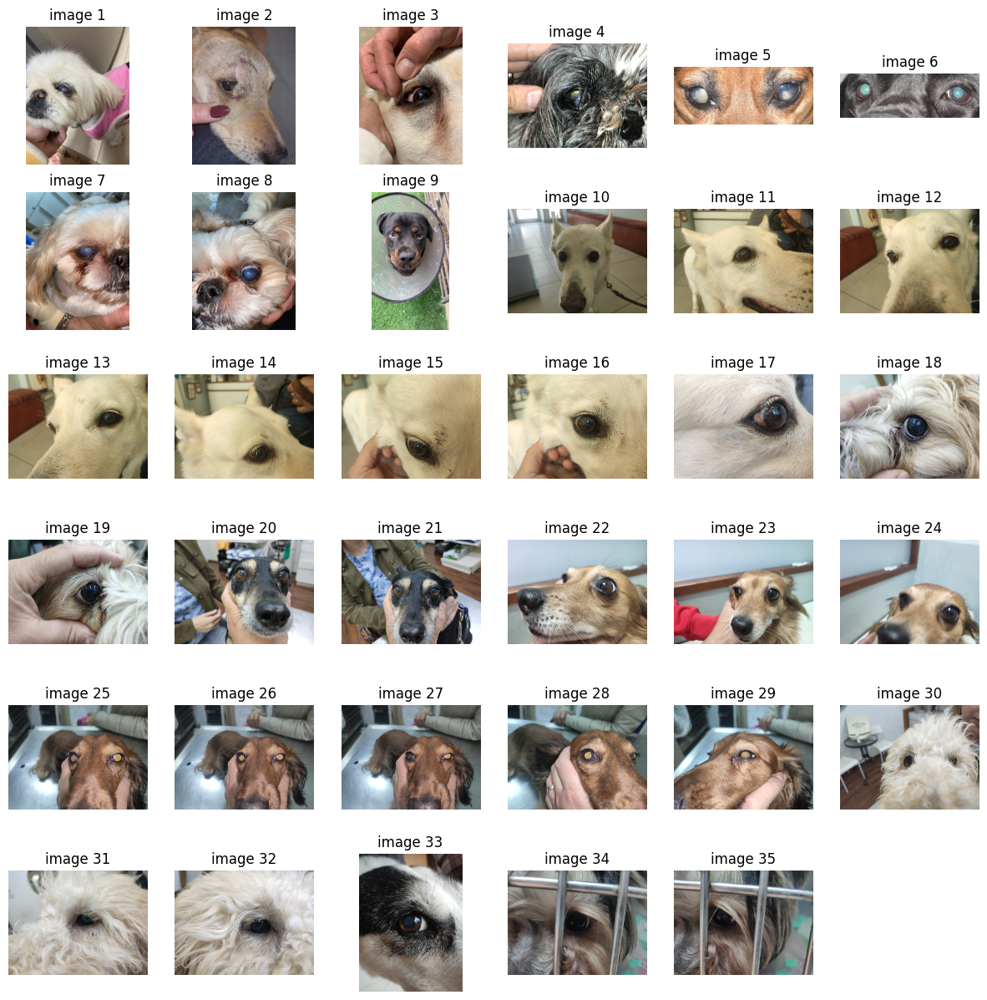

In [8]:
dogs = df[df.img.str.contains('dog_')].sort_values(by='img', key=natsort_keygen()).reset_index(drop=True)
show_pictures_in_grid(dogs, 0, len(dogs), grid_size=(6, 6), fig_size=(15, 15))

Group 3 (Other): The picture features a cat, or/and the eye is not fully visible. These pictures should be avoided (though cats will be added later)

  0%|          | 0/9 [00:00<?, ?it/s]

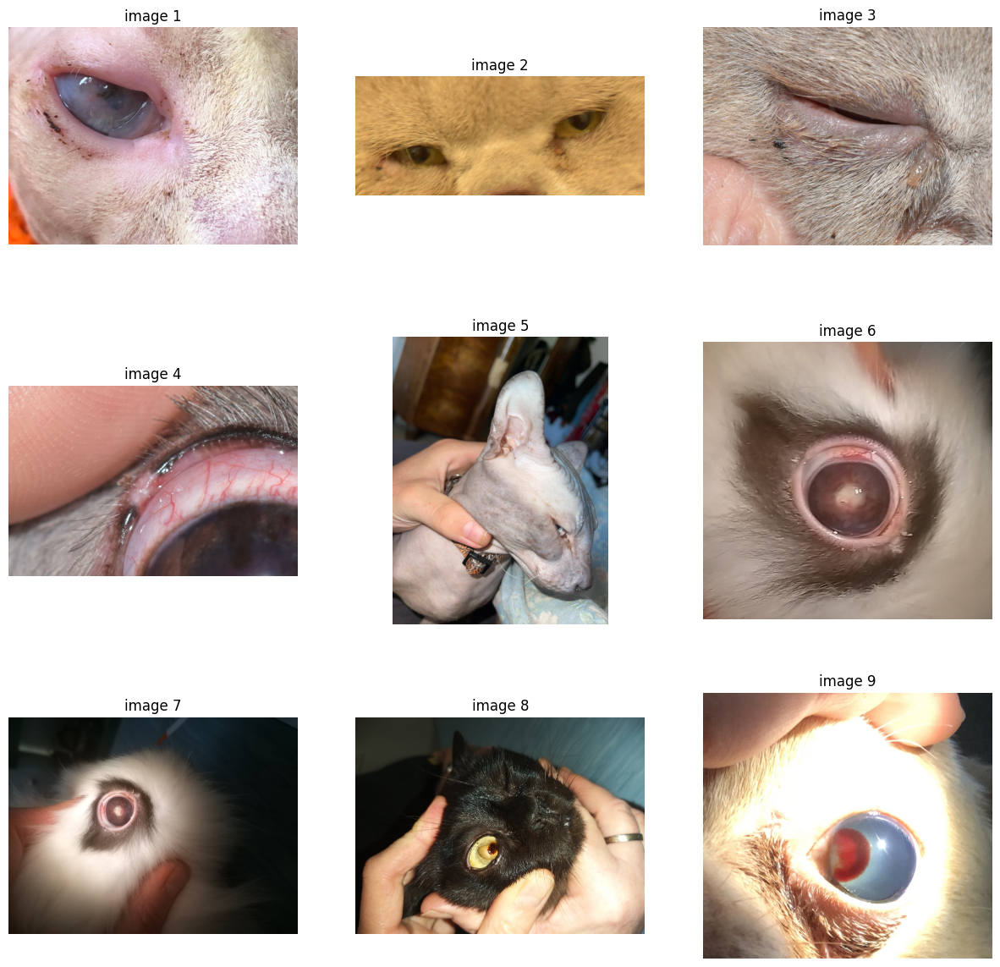

In [9]:
other = df[df.img.str.contains('other')].sort_values(by='img', key=natsort_keygen()).reset_index(drop=True)
gridsize = ceil(sqrt(len(other)))
show_pictures_in_grid(other, 0, len(other), grid_size=(gridsize, gridsize), fig_size=(15, 15))

George has a landmark-based detection algorithm. His algorithm finds the 2 extreme points of an eye.  
Given these 2 points, it's fairly easy to crop the eye from the bigger picture

In [10]:
def get_boundbox(point1: tuple[float, float], point2: tuple[float, float], scale_factor: float=1.1, ratio: float = 4) -> tuple[float, float, float, float]:
    
    s = scale_factor
    
    # get the centroid and the dx, dy of the points
    x1, y1 = point1
    x2, y2 = point2
    xm, ym = (x1 + x2) / 2, (y2 + y1) / 2
    dx, dy = abs(x1 - x2), abs(y1 - y2)
    
    half_width = dx / 2
    half_height = (dy + dx / ratio) / 2
    box_bounds = (xm -half_width*s,ym -half_height*s,xm +half_width*s,ym +half_height*s)
    
    return box_bounds

In [11]:
get_boundbox((5, 5), (10, 5))

(4.75, 4.3125, 10.25, 5.6875)

In [12]:
def display_chopped(img, x0, y0, xf, yf, scale_factor=1.5, ratio=2):
    bounds = [(x0, y0), (xf, yf)]
    crop = img.crop(get_boundbox(*bounds, scale_factor=scale_factor, ratio=ratio))
    fig = plt.figure(figsize=(20,20))
    plt.imshow(img)
    plt.imshow(crop)
    bounds_x, bounds_y = zip(*bounds)
    plt.scatter(bounds_x, bounds_y, c='r', s=10)
    plt.show()

In [13]:
# dogs = df[df.img.str.contains('dog_')].sort_values(by='img', key=natsort_keygen()).reset_index(drop=True)['img']
# eyes = df[df.img.str.contains('eye_')].sort_values(by='img', key=natsort_keygen()).reset_index(drop=True)['img']
# other = df[~df.img.str.contains('dog_') & ~df.img.str.contains('eye_')].sort_values(by='img', key=natsort_keygen()).reset_index(drop=True)['img']

print(f"# of pictures with cropped eyes: {len(eyes)}")
print(f"# of pictures with dogs in the frame, and the eyes are visible and open: {len(dogs)}")
print(f"# of other pictures: {len(other)}")


# of pictures with cropped eyes: 105
# of pictures with dogs in the frame, and the eyes are visible and open: 35
# of other pictures: 9


<!-- statistics = df[['width','height']].describe()
statistics = statistics[~statistics.index.isin(['count','mean','std'])].astype('int32')
df[['width','height']].hist(bins=20, figsize=(20,10))
display(statistics) -->

In [14]:
def sample_n_images(df, n=10):
    from numpy.random import choice, seed as np_seed
    np_seed(0)
    plt.close()
    for i in list(choice(df.index, n, replace=False)):
        plt.figure(i)
        plt.imshow(cvtColor(imread(df.img[i]), COLOR_BGR2RGB))
    plt.show()

In [15]:
sample = Image.open(dogs['img'][0])

Test the boundbox function on a relevant picture:

In [16]:
interact(
    display_chopped,
    img=fixed(sample), 
    x0=IntSlider(min=0, max=sample.width, value=430, step=10, layout={'width': '80%'}), 
    xf=IntSlider(min=0, max=sample.width, value=750, step=10, layout={'width': '80%'}), 
    y0=IntSlider(min=0, max=sample.height, value=930, step=10, layout={'width': '80%'}), 
    yf=IntSlider(min=0, max=sample.height, value=980, step=10, layout={'width': '80%'}),
    scale_factor=FloatSlider(min=1, max=3, value=1.5, step=0.1, layout={'width': '80%'}),
    ratio=FloatSlider(min=1, max=10, value=2, step=0.25, layout={'width': '80%'})
)
# x0 = 430, y0 = 930, xf = 750, yf = 980

interactive(children=(IntSlider(value=430, description='x0', layout=Layout(width='80%'), max=1536, step=10), I…

<function __main__.display_chopped(img, x0, y0, xf, yf, scale_factor=1.5, ratio=2)>

In [17]:
dogs_df = pandas_read_csv('../resources/other/dog_tim_temporary_export.csv')
columns = ['id']
columns += dogs_df.columns[dogs_df.columns.str.contains('L') | dogs_df.columns.str.contains('R')].to_list()
dogs_df = dogs_df[columns]
dogs_df[dogs_df.columns[~(dogs_df.columns == 'id')]] = dogs_df[dogs_df.columns[~(dogs_df.columns == 'id')]].astype('float16')
dogs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      178 non-null    object 
 1   REOC_x  178 non-null    float16
 2   REOC_y  178 non-null    float16
 3   REIC_x  178 non-null    float16
 4   REIC_y  178 non-null    float16
 5   LEOC_x  177 non-null    float16
 6   LEOC_y  177 non-null    float16
 7   LEIC_x  178 non-null    float16
 8   LEIC_y  178 non-null    float16
dtypes: float16(8), object(1)
memory usage: 4.3+ KB


In [18]:
dogs_df['img'] = dogs_df['id'].apply(lambda x: f'../resources/cats_and_dogs/test_img/{x}.jpg')
dogs_df[dogs_df.id.str.startswith('Amber')].reset_index(drop=True)

,id,REOC_x,REOC_y,REIC_x,REIC_y,LEOC_x,LEOC_y,LEIC_x,LEIC_y,img
0,Amber_S1_53_21_86,720.5,477.25,771.5,499.25,975.5,440.25,923.5,473.75,../resources/cats_and_dogs/test_img/Amber_S1_5...
1,Amber_S1_212_57_80,872.5,625.00,913.5,645.50,1151.0,586.00,1096.0,623.50,../resources/cats_and_dogs/test_img/Amber_S1_2...
2,Amber_S1_215_01_80,856.0,597.50,899.5,630.00,1156.0,556.00,1092.0,603.50,../resources/cats_and_dogs/test_img/Amber_S1_2...
3,Amber_S1_327_12_85,761.5,471.75,808.0,485.00,1036.0,447.00,988.5,470.25,../resources/cats_and_dogs/test_img/Amber_S1_3...
4,Amber_S1_354_55_76,728.5,457.00,770.0,473.00,962.5,419.50,920.5,444.50,../resources/cats_and_dogs/test_img/Amber_S1_3...
5,Amber_S1_361_56_74,743.5,690.50,780.5,711.50,1025.0,645.00,959.5,681.00,../resources/cats_and_dogs/test_img/Amber_S1_3...
6,Amber_S2_146_84_79,868.0,503.50,915.5,515.50,1082.0,462.00,1044.0,478.75,../resources/cats_and_dogs/test_img/Amber_S2_1...
7,Amber_S2_175_04_83,842.0,774.50,890.0,795.50,1132.0,766.00,1081.0,791.00,../resources/cats_and_dogs/test_img/Amber_S2_1...
8,Amber_S2_199_76_78,785.0,526.00,830.0,542.00,1047.0,486.25,1005.5,506.00,../resources/cats_and_dogs/test_img/Amber_S2_1...
9,Amber_S2_312_47_86,789.5,577.50,835.5,590.00,1043.0,526.00,993.0,558.00,../resources/cats_and_dogs/test_img/Amber_S2_3...


In [19]:
dogs_df['R_eye'] = dogs_df.progress_apply(lambda r: get_boundbox(point1=(r['REOC_x'], r['REOC_y']), point2=(r['REIC_x'], r['REIC_y']), scale_factor=2), axis=1)
dogs_df['L_eye'] = dogs_df.progress_apply(lambda r: get_boundbox(point1=(r['LEOC_x'], r['LEOC_y']), point2=(r['LEIC_x'], r['LEIC_y']), scale_factor=2), axis=1)

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

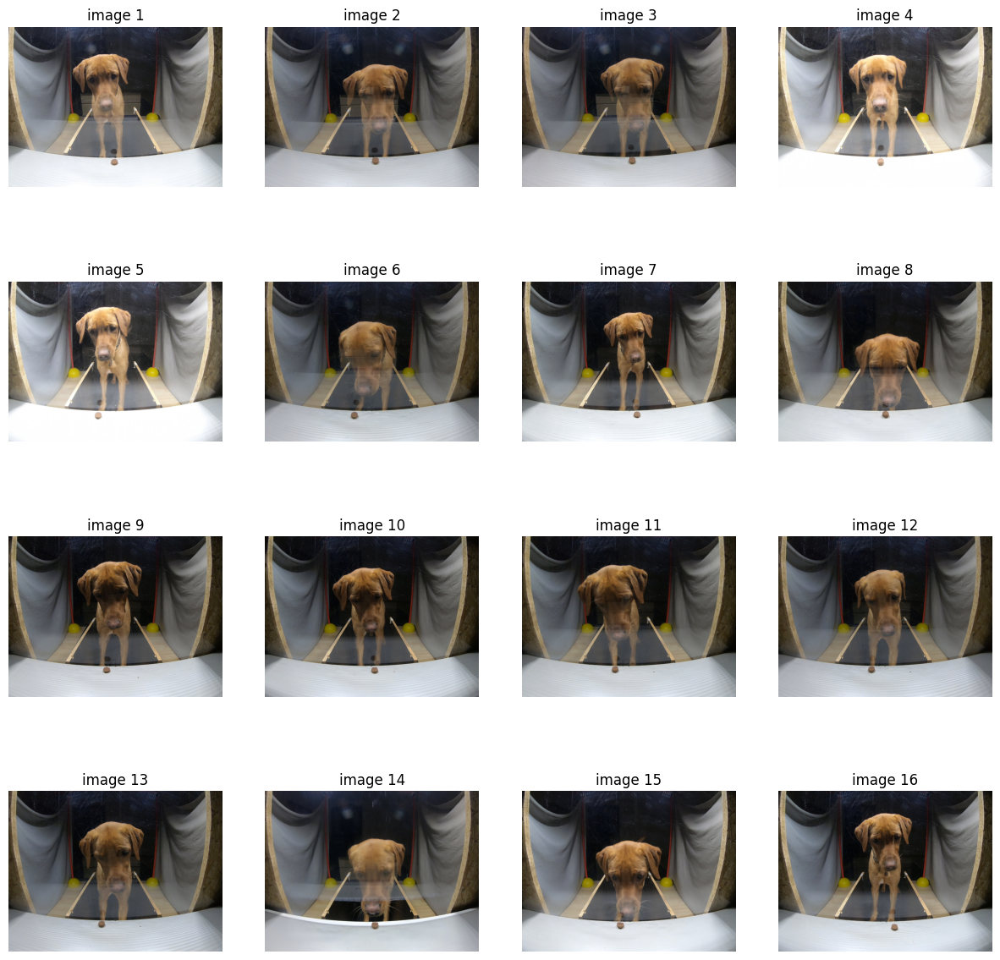

In [20]:
Amber = dogs_df[dogs_df.id.str.startswith('Amber')].reset_index(drop=True)
show_pictures_in_grid(Amber, 0, 16, grid_size=(4, 4), fig_size=(15, 15))

In [21]:
Amber

,id,REOC_x,REOC_y,REIC_x,REIC_y,LEOC_x,LEOC_y,LEIC_x,LEIC_y,img,R_eye,L_eye
0,Amber_S1_53_21_86,720.5,477.25,771.5,499.25,975.5,440.25,923.5,473.75,../resources/cats_and_dogs/test_img/Amber_S1_5...,"(695.0, 453.5, 797.0, 523.0)","(897.5, 410.5, 1001.5, 503.5)"
1,Amber_S1_212_57_80,872.5,625.00,913.5,645.50,1151.0,586.00,1096.0,623.50,../resources/cats_and_dogs/test_img/Amber_S1_2...,"(852.0, 604.5, 934.0, 666.0)","(1068.5, 553.5, 1178.5, 656.0)"
2,Amber_S1_215_01_80,856.0,597.50,899.5,630.00,1156.0,556.00,1092.0,603.50,../resources/cats_and_dogs/test_img/Amber_S1_2...,"(834.25, 570.375, 921.25, 657.125)","(1060.0, 516.25, 1188.0, 643.25)"
3,Amber_S1_327_12_85,761.5,471.75,808.0,485.00,1036.0,447.00,988.5,470.25,../resources/cats_and_dogs/test_img/Amber_S1_3...,"(738.25, 453.5, 831.25, 503.25)","(964.75, 423.5, 1059.75, 493.75)"
4,Amber_S1_354_55_76,728.5,457.00,770.0,473.00,962.5,419.50,920.5,444.50,../resources/cats_and_dogs/test_img/Amber_S1_3...,"(707.75, 438.625, 790.75, 491.375)","(899.5, 396.5, 983.5, 467.5)"
5,Amber_S1_361_56_74,743.5,690.50,780.5,711.50,1025.0,645.00,959.5,681.00,../resources/cats_and_dogs/test_img/Amber_S1_3...,"(725.0, 670.75, 799.0, 731.25)","(926.75, 610.625, 1057.75, 715.375)"
6,Amber_S2_146_84_79,868.0,503.50,915.5,515.50,1082.0,462.00,1044.0,478.75,../resources/cats_and_dogs/test_img/Amber_S2_1...,"(844.25, 485.625, 939.25, 533.375)","(1025.0, 444.125, 1101.0, 496.625)"
7,Amber_S2_175_04_83,842.0,774.50,890.0,795.50,1132.0,766.00,1081.0,791.00,../resources/cats_and_dogs/test_img/Amber_S2_1...,"(818.0, 752.0, 914.0, 818.0)","(1055.5, 740.75, 1157.5, 816.25)"
8,Amber_S2_199_76_78,785.0,526.00,830.0,542.00,1047.0,486.25,1005.5,506.00,../resources/cats_and_dogs/test_img/Amber_S2_1...,"(762.5, 506.75, 852.5, 561.25)","(984.75, 466.0, 1067.75, 526.25)"
9,Amber_S2_312_47_86,789.5,577.50,835.5,590.00,1043.0,526.00,993.0,558.00,../resources/cats_and_dogs/test_img/Amber_S2_3...,"(766.5, 559.75, 858.5, 607.75)","(968.0, 497.5, 1068.0, 586.5)"


In [22]:
def show_eyes(df):
    import matplotlib.patches as patches
    for i in range(len(df)):
        img = Image.open(df.img[i])
        fig = plt.figure()
        fig, ax = plt.subplots()
        plt.imshow(img)
        boundR = patches.Rectangle((df.R_eye[i][0], df.R_eye[i][1]), df.R_eye[i][2] - df.R_eye[i][0], df.R_eye[i][3] - df.R_eye[i][1], linewidth=1, edgecolor='r', facecolor='none')
        boundL = patches.Rectangle((df.L_eye[i][0], df.L_eye[i][1]), df.L_eye[i][2] - df.L_eye[i][0], df.L_eye[i][3] - df.L_eye[i][1], linewidth=1, edgecolor='r', facecolor='none')
        
        ax.add_patch(boundR)
        ax.add_patch(boundL)
        fig = plt.figure()
        plt.imshow(img.crop(df.R_eye[i]))
        fig = plt.figure()
        plt.imshow(img.crop(df.L_eye[i]))
        plt.show()
    

<Figure size 640x480 with 0 Axes>

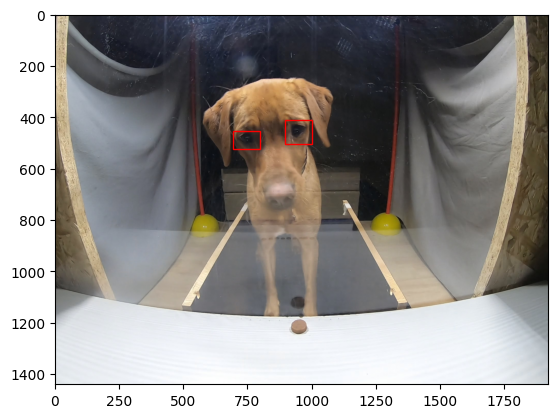

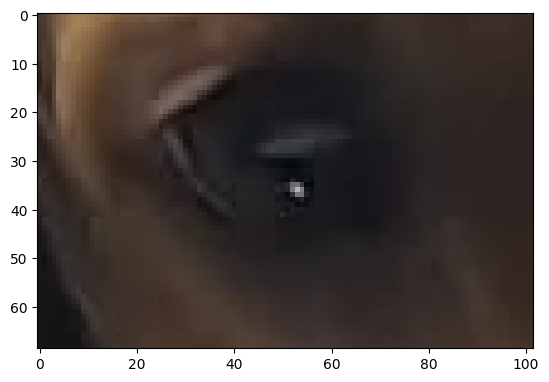

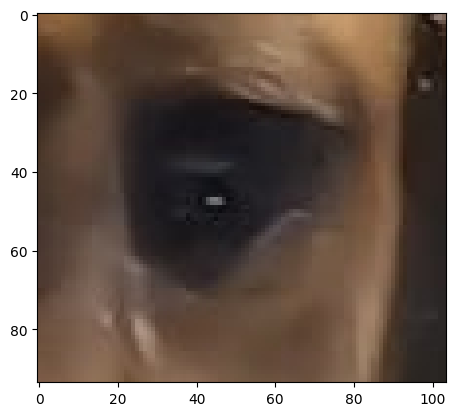

<Figure size 640x480 with 0 Axes>

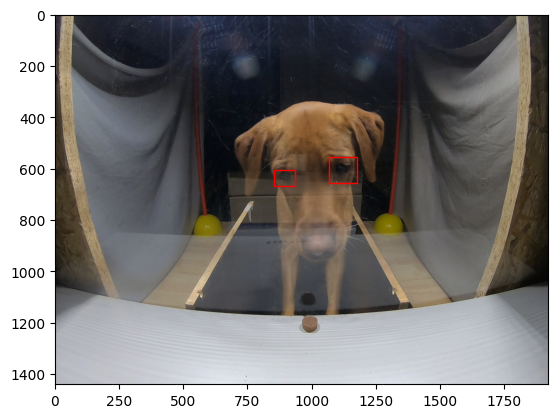

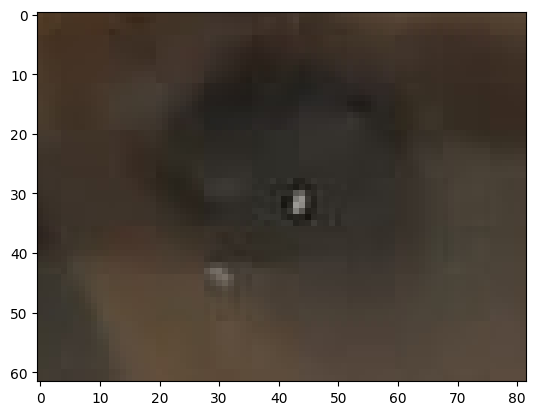

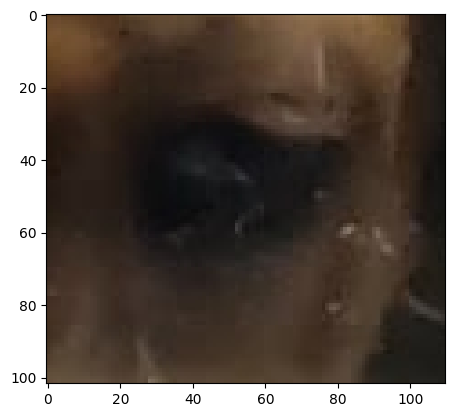

<Figure size 640x480 with 0 Axes>

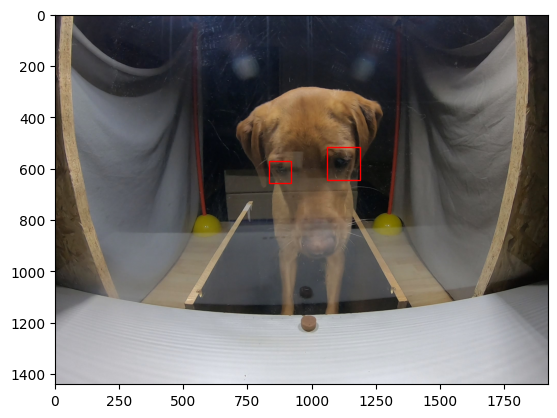

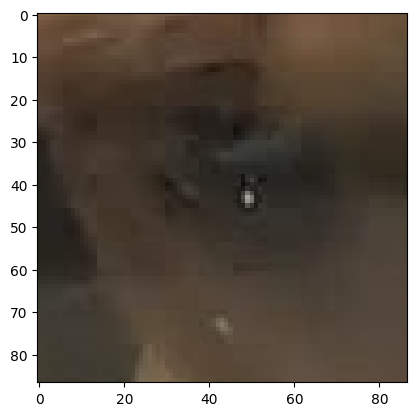

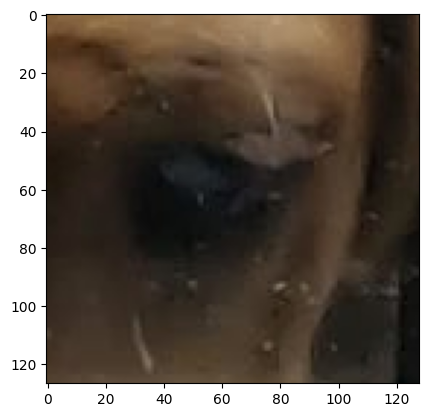

<Figure size 640x480 with 0 Axes>

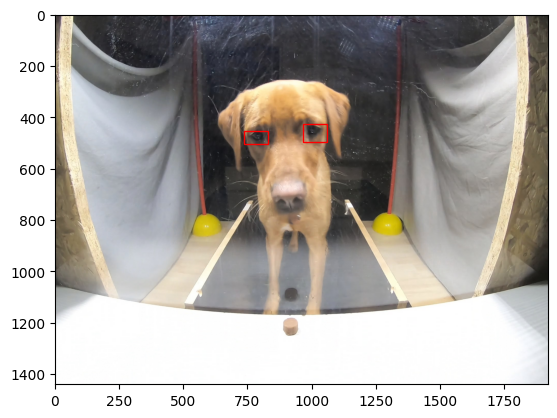

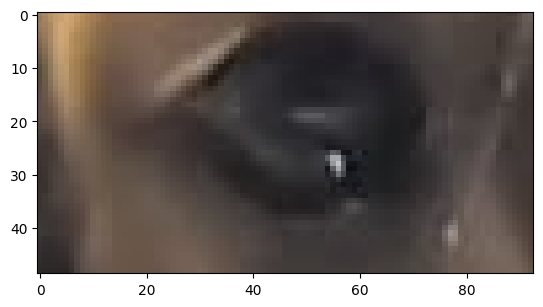

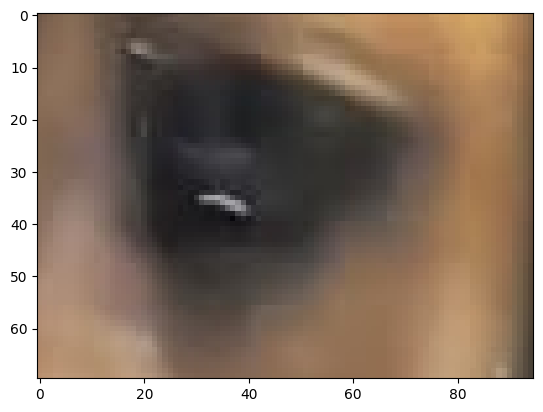

<Figure size 640x480 with 0 Axes>

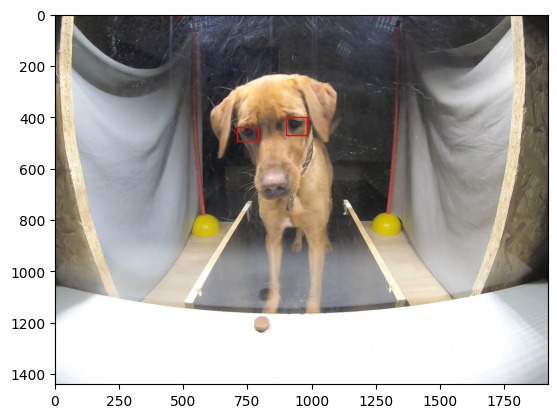

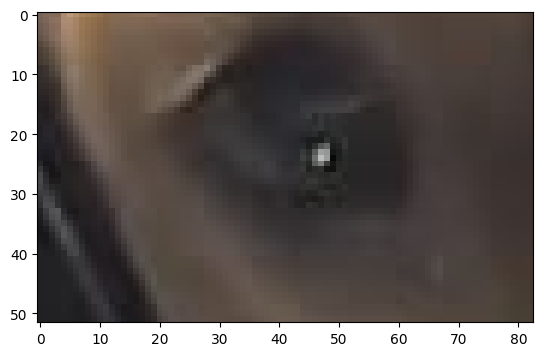

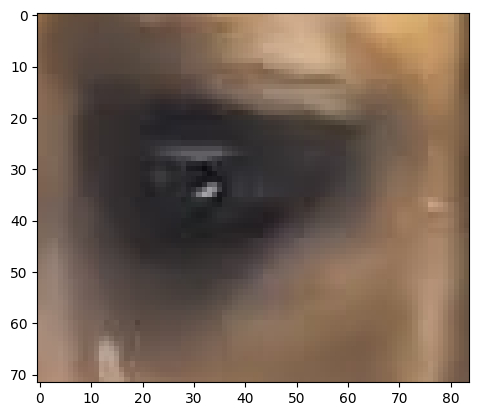

<Figure size 640x480 with 0 Axes>

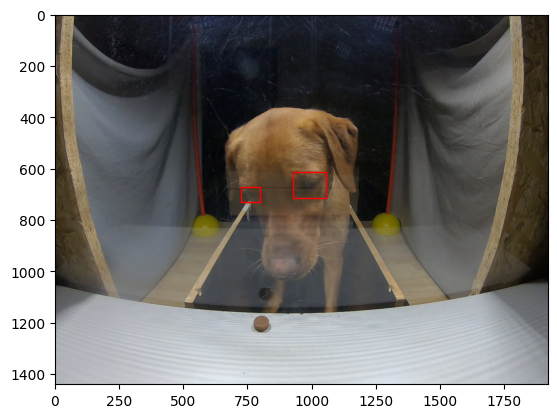

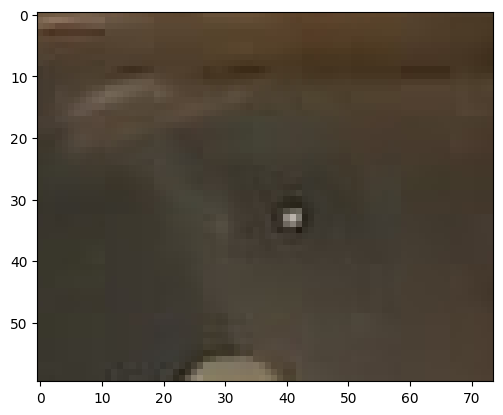

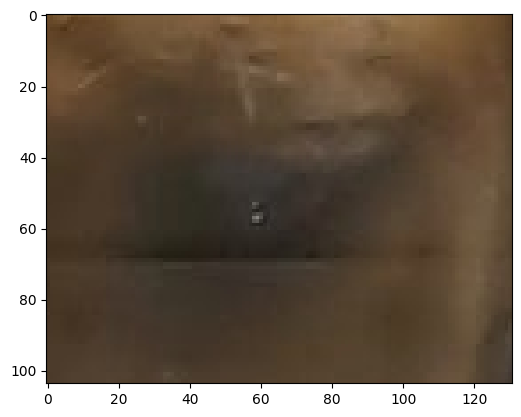

<Figure size 640x480 with 0 Axes>

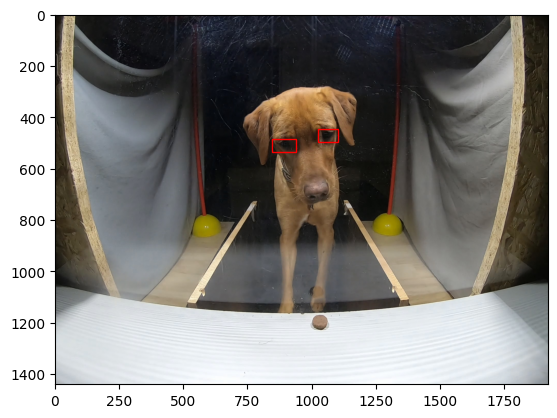

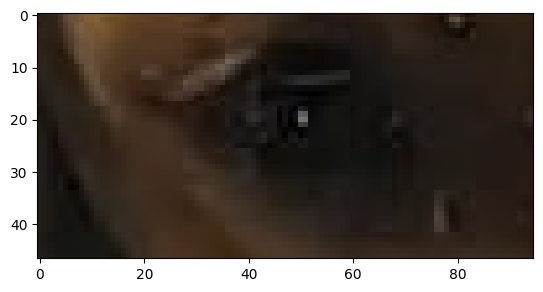

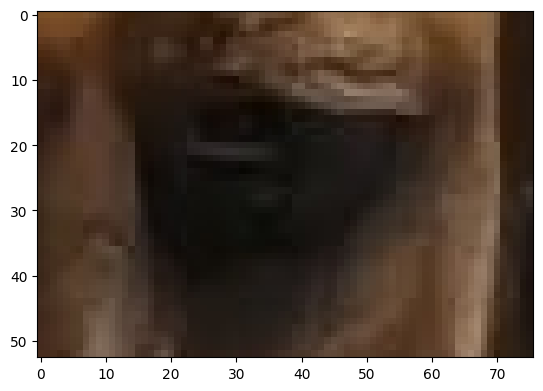

<Figure size 640x480 with 0 Axes>

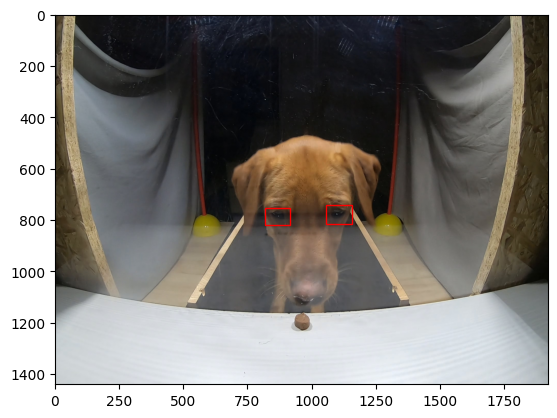

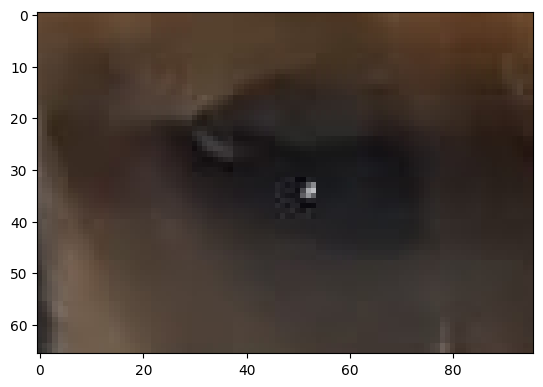

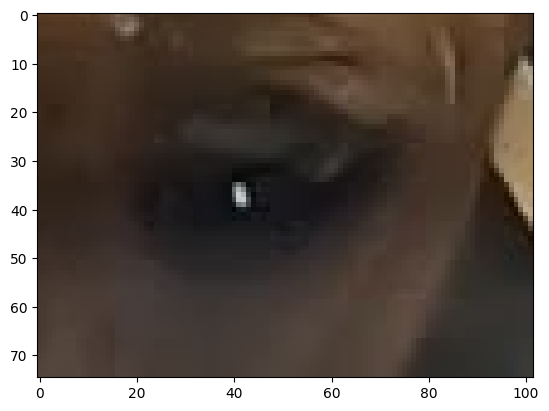

<Figure size 640x480 with 0 Axes>

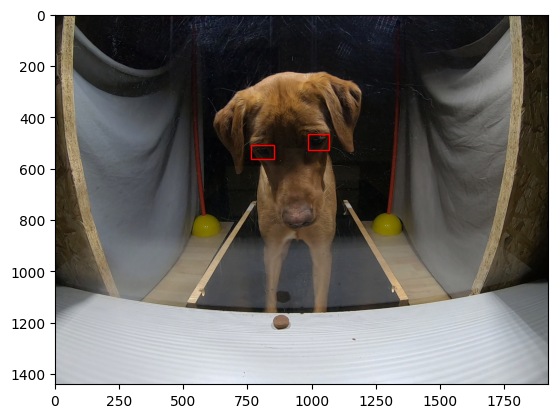

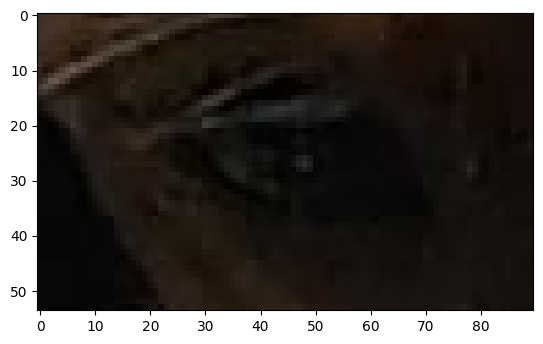

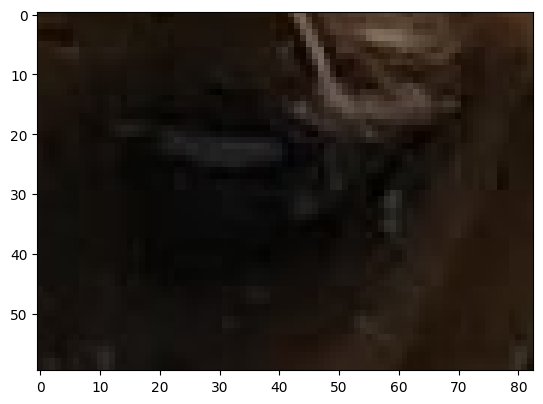

<Figure size 640x480 with 0 Axes>

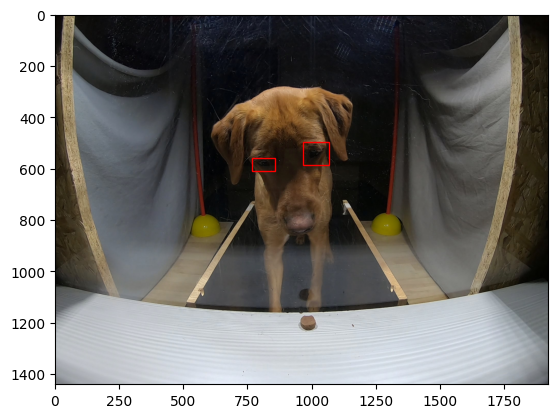

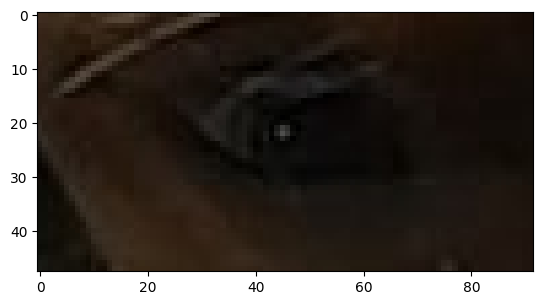

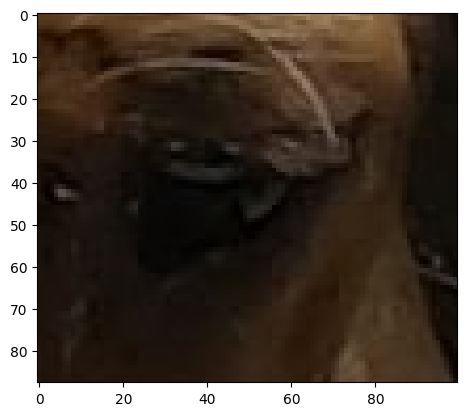

<Figure size 640x480 with 0 Axes>

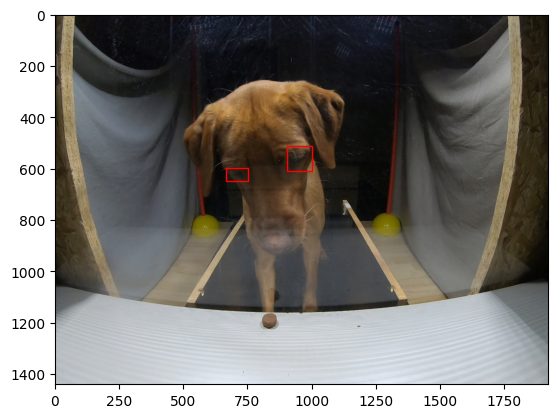

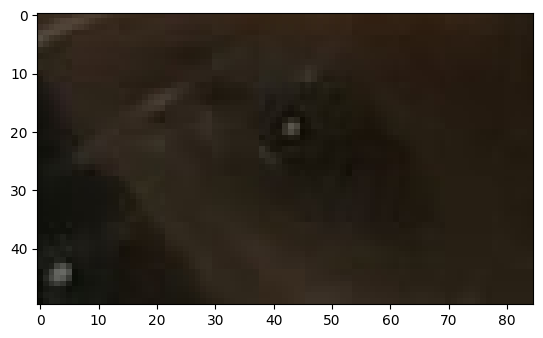

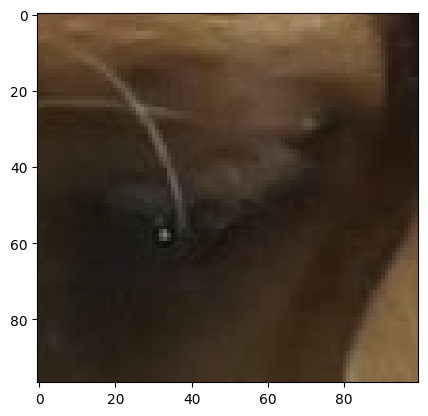

<Figure size 640x480 with 0 Axes>

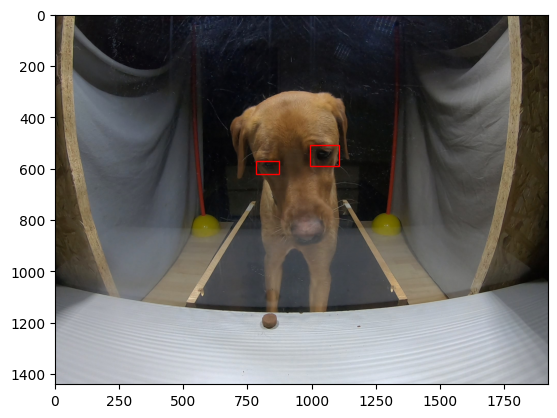

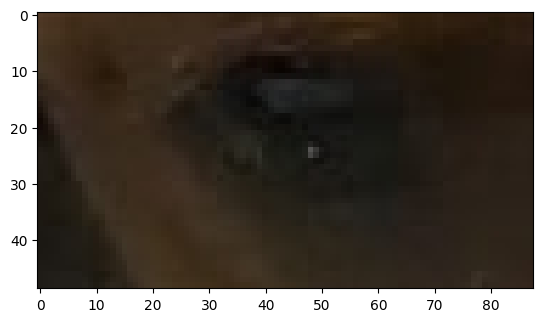

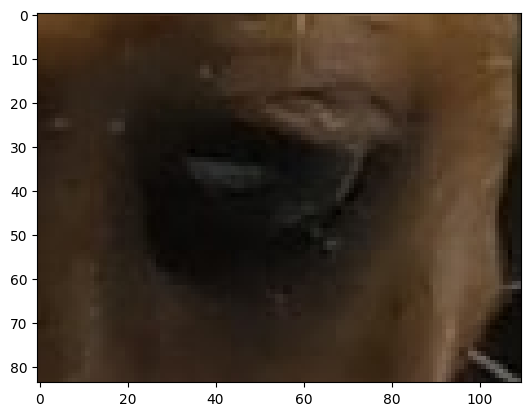

<Figure size 640x480 with 0 Axes>

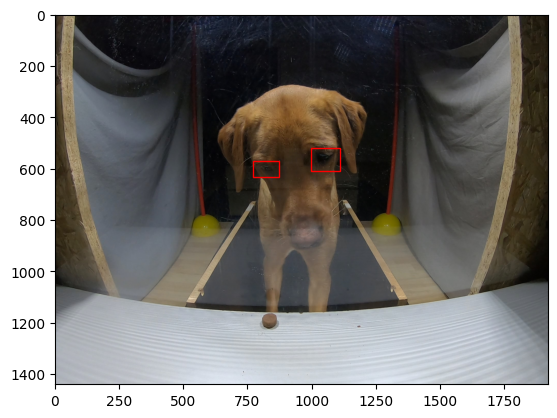

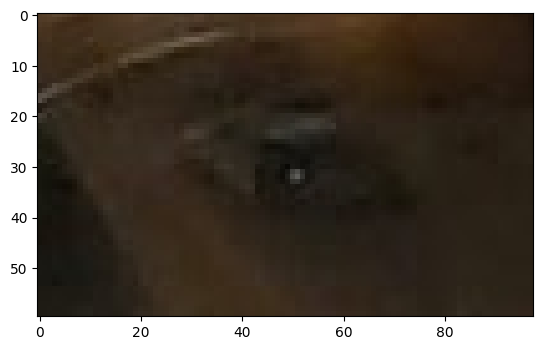

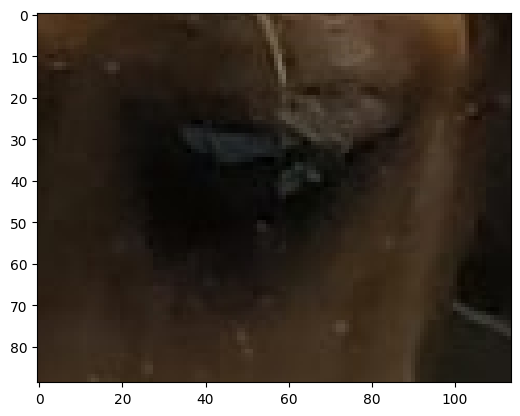

<Figure size 640x480 with 0 Axes>

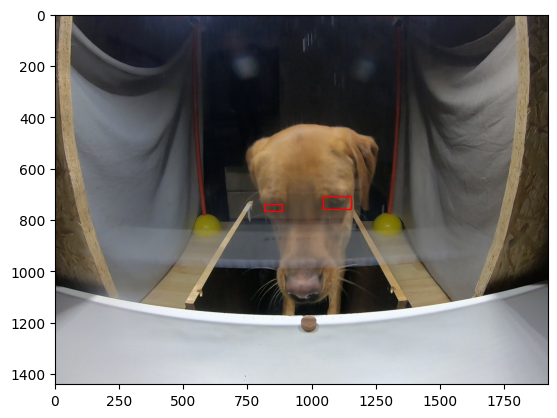

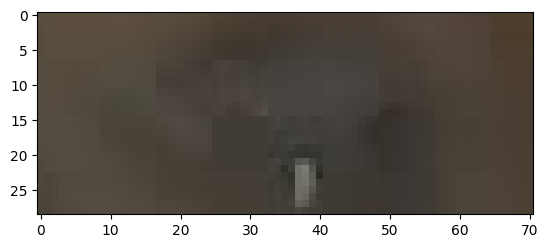

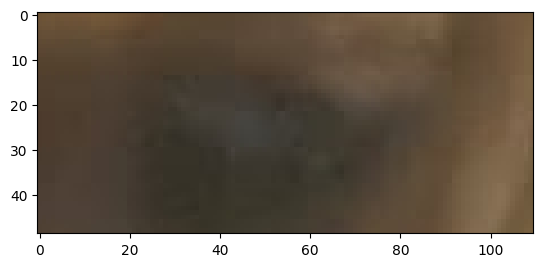

<Figure size 640x480 with 0 Axes>

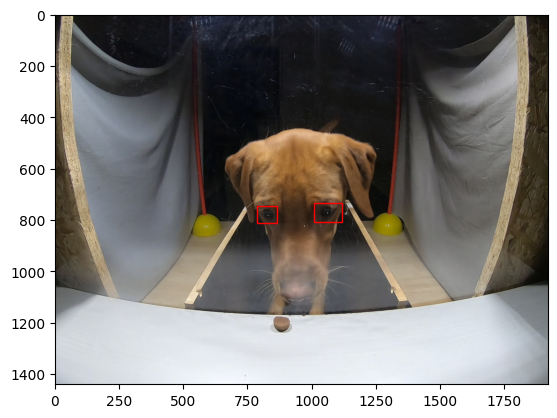

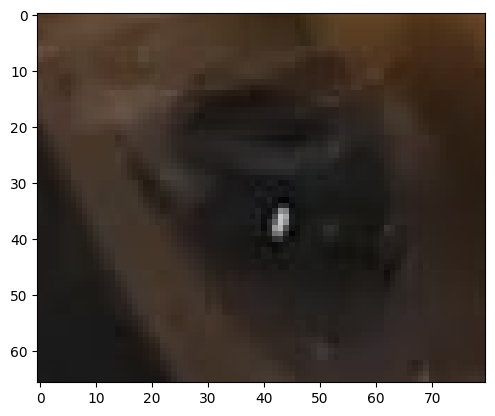

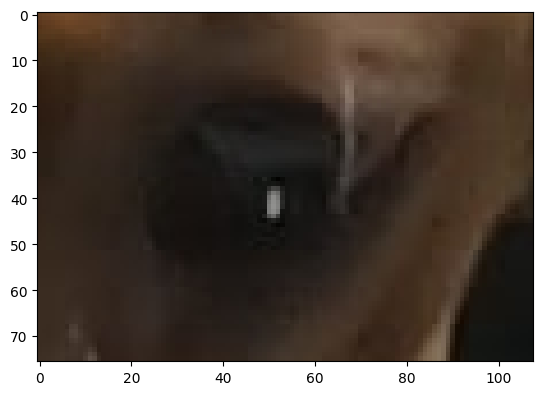

<Figure size 640x480 with 0 Axes>

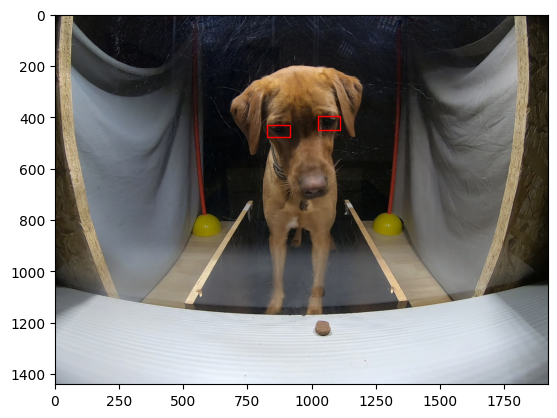

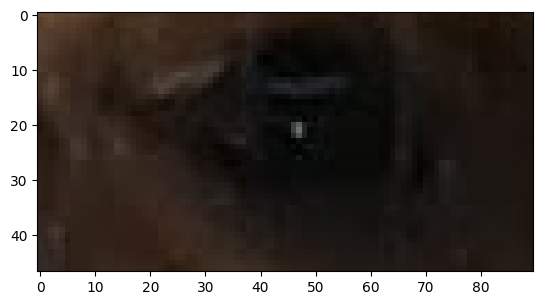

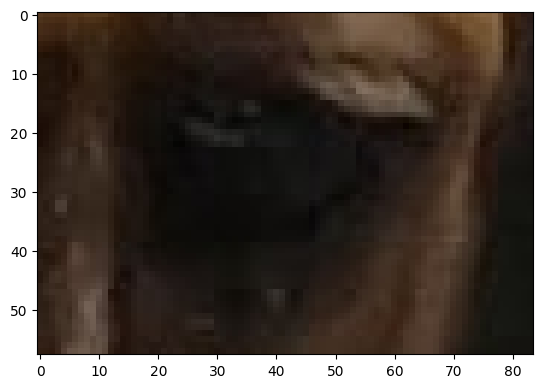

In [23]:
show_eyes(Amber)